In [1]:
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import os

In [2]:
# load the model from the file
model = load_model('food_model_new_95.h5')

In [3]:
pre_dict = {}
train_dir = 'data/train_food'
for count, classes in enumerate(os.listdir(train_dir)):
    pre_dict[count]  = classes
pre_dict[count+1] = 'unknown'

In [4]:
pre_dict

{0: 'afang',
 1: 'dodo',
 2: 'egusi',
 3: 'ewa',
 4: 'ewedu',
 5: 'indomie',
 6: 'jollof',
 7: 'moi moi',
 8: 'oha',
 9: 'okro',
 10: 'puff puff',
 11: 'suya',
 12: 'unknown'}

In [5]:
def make_predictions(path, special=False):
    predictions = []
    images = []
    true_output = []
    for i in os.listdir(path):
        img_path = os.path.join(path, i)
        img = load_img(img_path, target_size=(224, 224))
        preview_img = load_img(img_path)
        # convert the image to a NumPy array and rescale to values between 0 and 1
        img = img_to_array(img) / 255.0
        prev_img = img_to_array(preview_img) / 255.0
        images.append(prev_img)
        
        if special:
            labels = i.split(',')[:2]
            true_output.append(labels)
        else:
            for key, value in pre_dict.items():
                if value in img_path:
                    true_output.append(value)
        # add a batch dimension to the array
        predict_img = tf.expand_dims(img, axis=0)

        predictions.append(model.predict(predict_img, verbose=0))
    return predictions, images, true_output

In [6]:
predictions, images, true_labels = make_predictions('data/test_food')

Image 1
Prediction: dodo  |  Actual: dodo


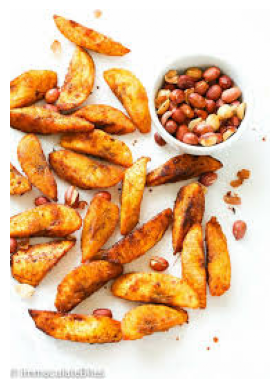

Image 2
Prediction: dodo(unsure)  |  Actual: dodo


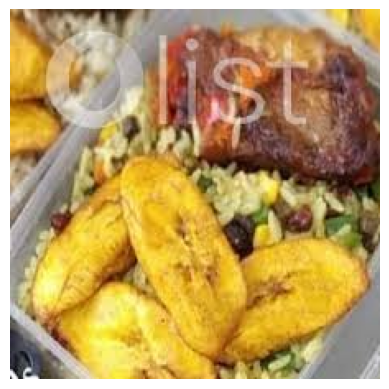

Image 3
Prediction: dodo  |  Actual: dodo


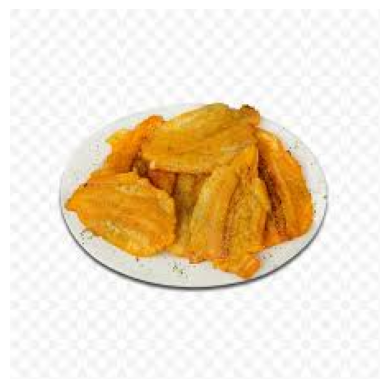

Image 4
Prediction: dodo  |  Actual: dodo


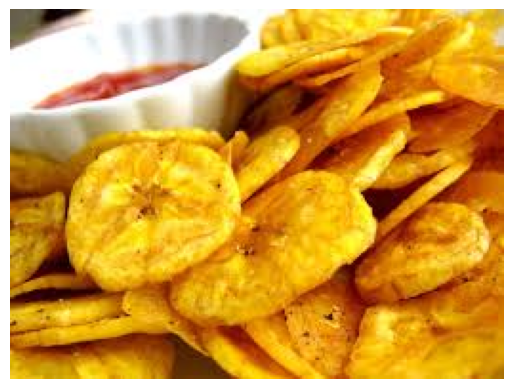

Image 5
Prediction: moi moi(unsure)  |  Actual: ewedu


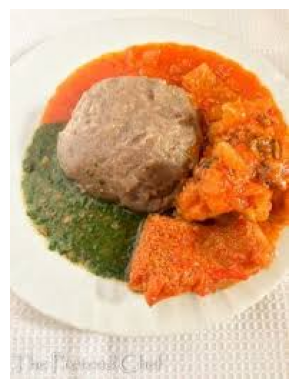

Image 6
Prediction: jollof(unsure)  |  Actual: indomie


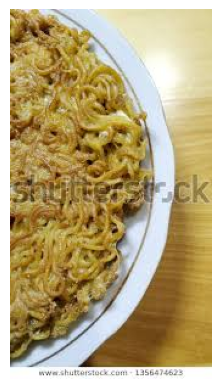

Image 7
Prediction: indomie  |  Actual: indomie


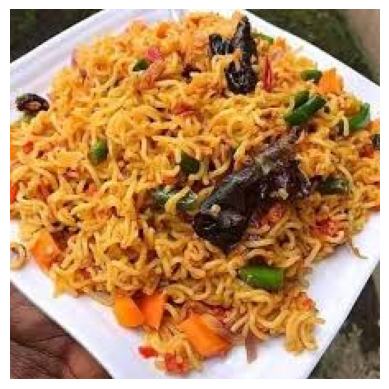

Image 8
Prediction: indomie  |  Actual: indomie


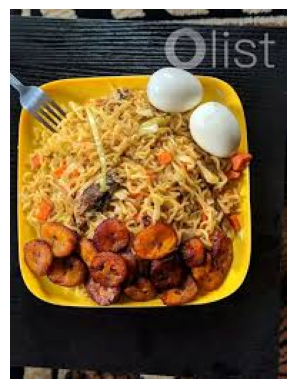

Image 9
Prediction: indomie  |  Actual: indomie


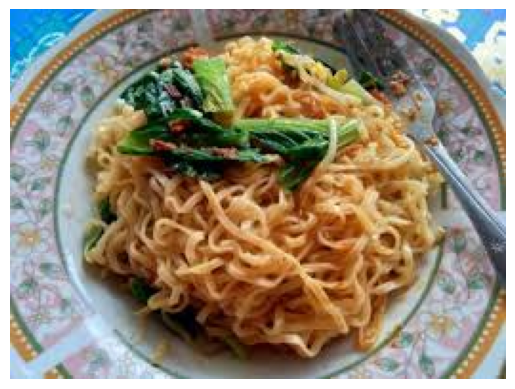

Image 10
Prediction: indomie  |  Actual: indomie


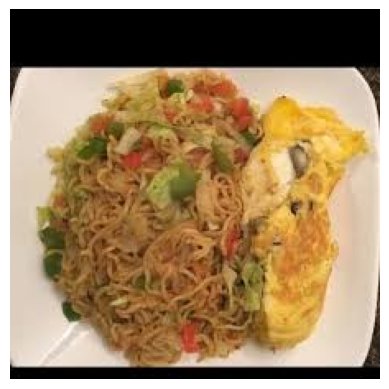

Image 11
Prediction: ewa  |  Actual: indomie


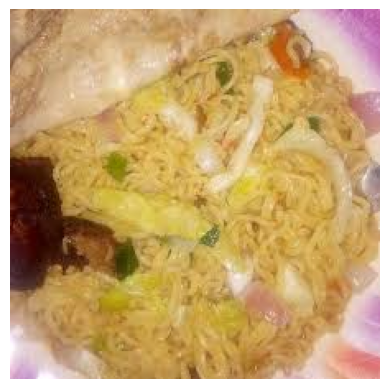

Image 12
Prediction: oha  |  Actual: indomie


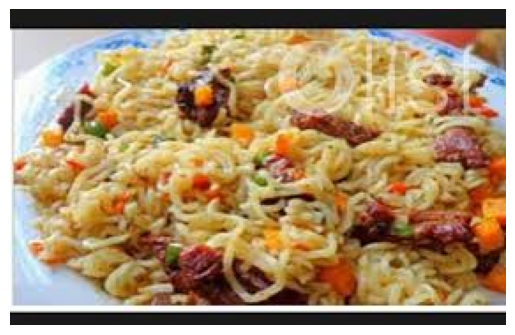

Image 13
Prediction: indomie(unsure)  |  Actual: indomie


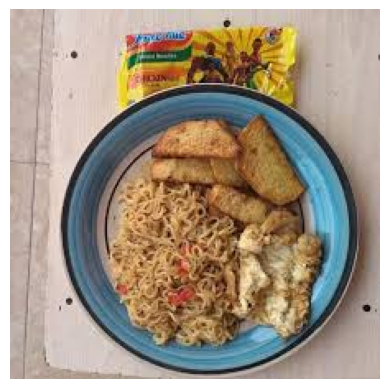

Image 14
Prediction: indomie(unsure)  |  Actual: indomie


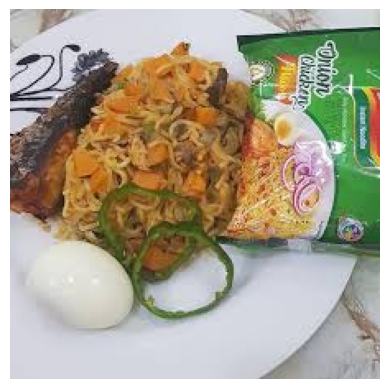

Image 15
Prediction: indomie  |  Actual: indomie


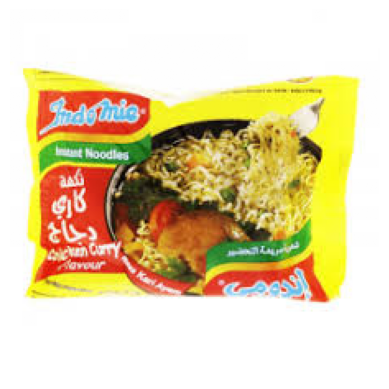

Image 16
Prediction: indomie  |  Actual: indomie


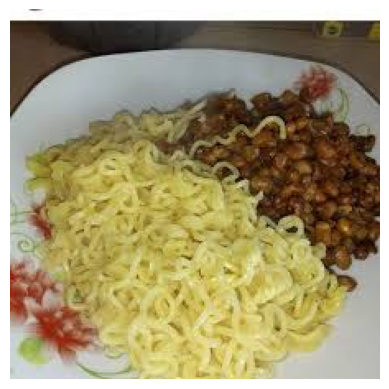

Image 17
Prediction: jollof  |  Actual: jollof


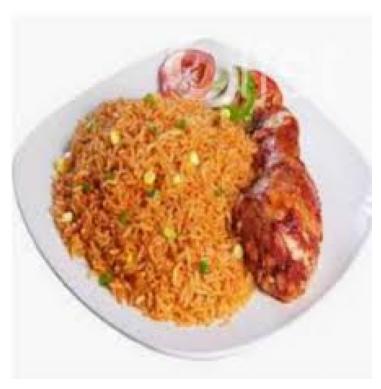

Image 18
Prediction: egusi  |  Actual: jollof


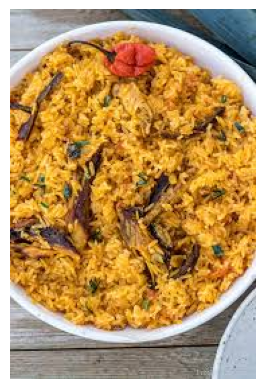

Image 19
Prediction: afang(unsure)  |  Actual: jollof


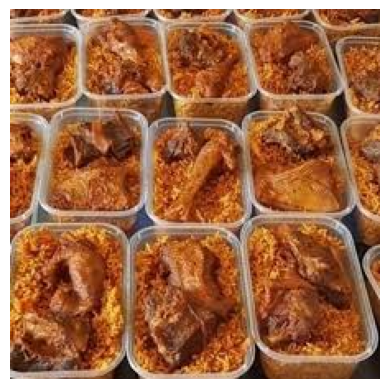

Image 20
Prediction: ewa(unsure)  |  Actual: jollof


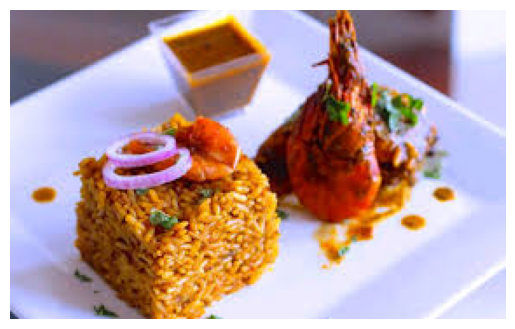

Image 21
Prediction: okro  |  Actual: okro


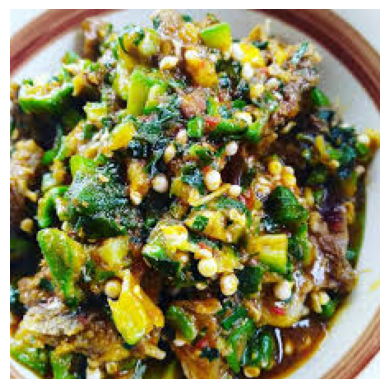

Image 22
Prediction: puff puff  |  Actual: puff puff


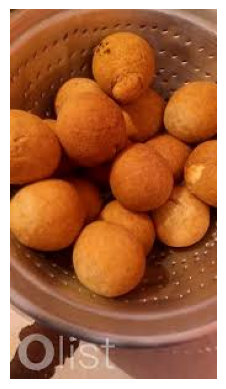

Image 23
Prediction: oha(unsure)  |  Actual: puff puff


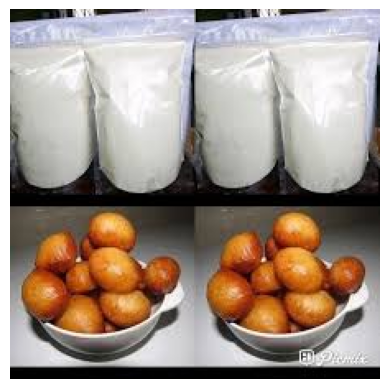

Image 24
Prediction: puff puff  |  Actual: puff puff


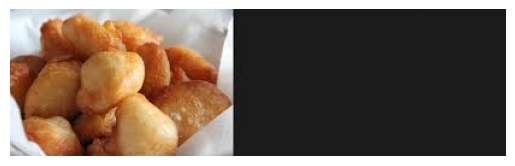

Image 25
Prediction: puff puff  |  Actual: puff puff


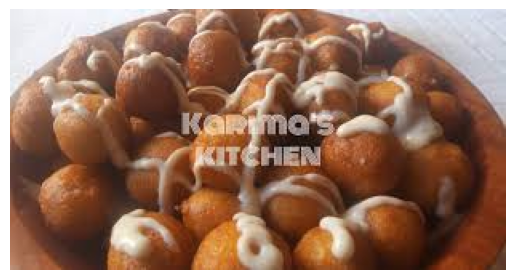

Image 26
Prediction: suya  |  Actual: suya


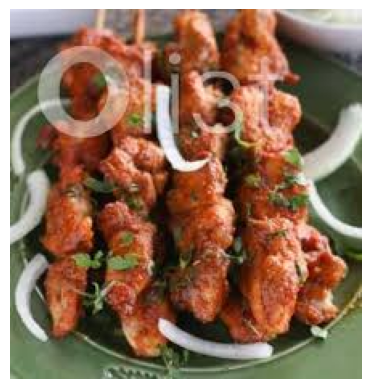

Image 27
Prediction: suya  |  Actual: suya


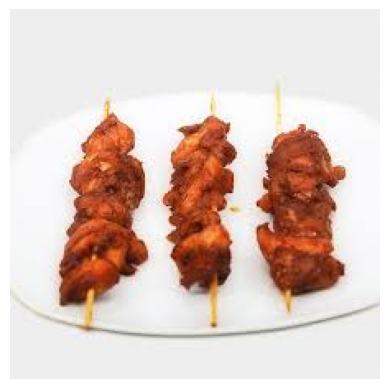

Image 28
Prediction: suya  |  Actual: suya


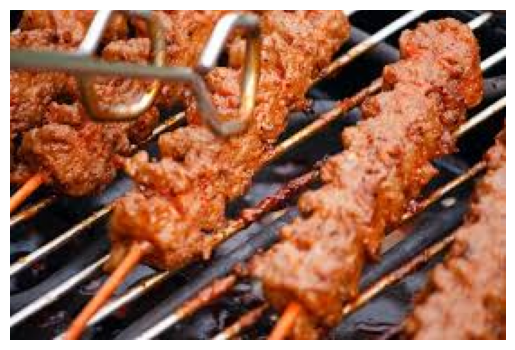

Image 29
Prediction: suya  |  Actual: suya


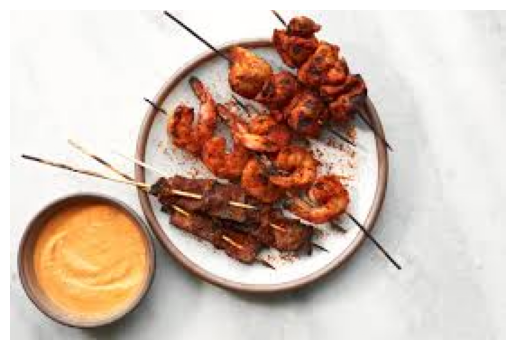

Image 30
Prediction: suya  |  Actual: suya


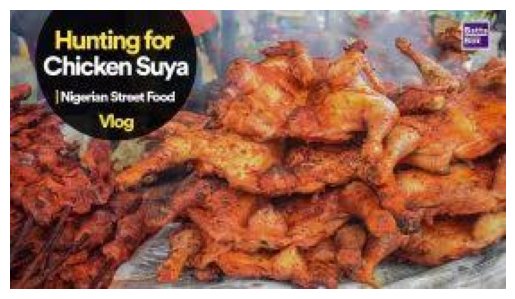

In [7]:
acc = 0
for i in range(len(predictions)):
    print(f'Image {i+1}')
    index = [index for index, x in enumerate(predictions[i]) if x > 0.5]
    try:
        index = index[0]
        confidence = ''
    except IndexError:
        index = [predictions[i].index(max(predictions[i]))][0]
        confidence = '(unsure)'
    
    if pre_dict[index] == true_labels[i]:
        acc += 1
    
    print(f'Prediction: {pre_dict[index]}{confidence}  |  Actual: {true_labels[i]}')
    plt.imshow(images[i])
    plt.axis('off')
    plt.show()

In [8]:
print("Accuracy: {:.2f}%".format(acc/len(predictions)*100))

Accuracy: 73.33%


In [9]:
pred, image, labels = make_predictions('data/special', special=True)

Image  1
Prediction: ewa(84%) and dodo(7%)|  Actual: dodo and  ewa


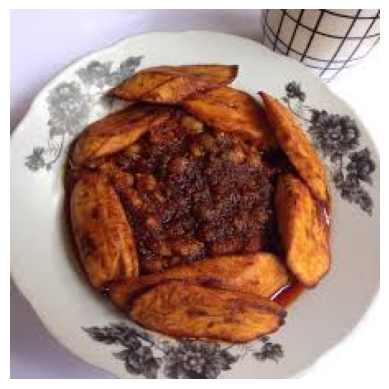

Image  2
Prediction: ewa(78%) and dodo(12%)|  Actual: dodo and  ewa


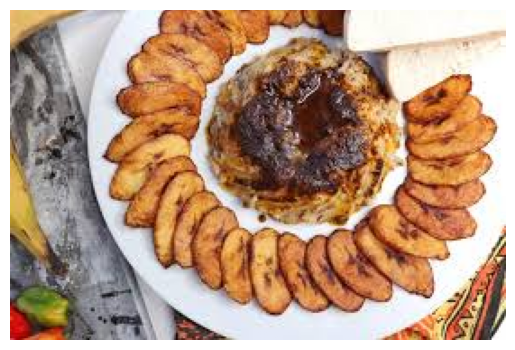

Image  3
Prediction: dodo(69%) and ewa(9%)|  Actual: dodo and  ewa


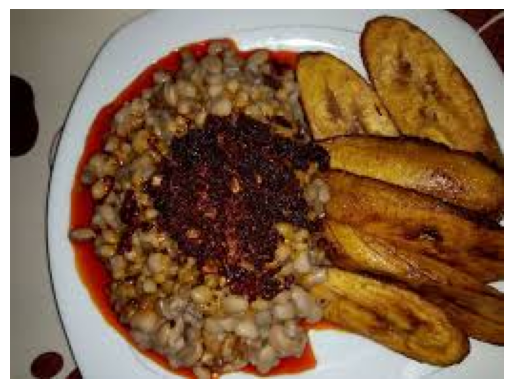

Image  4
Prediction: dodo(1%) and ewa(0%)|  Actual: dodo and  ewa


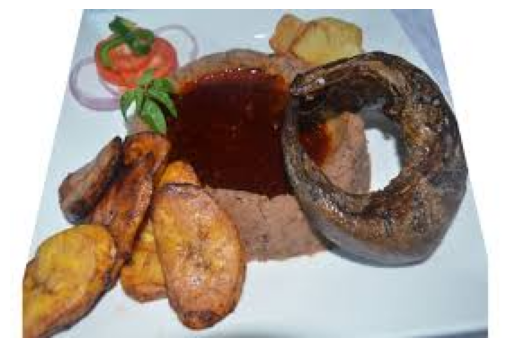

Image  5
Prediction: ewa(97%) and jollof(2%)|  Actual: dodo and  ewa


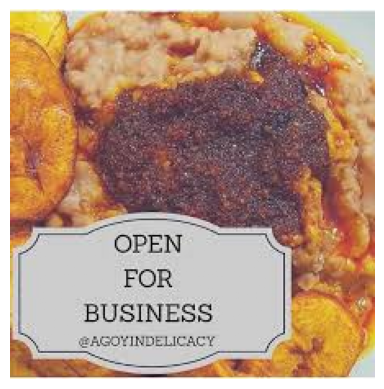

Image  6
Prediction: dodo(96%) and ewa(1%)|  Actual: dodo and  ewa


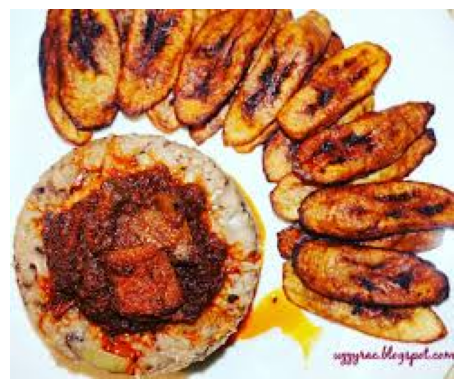

Image  7
Prediction: dodo(98%) and suya(11%)|  Actual: dodo and  ewa


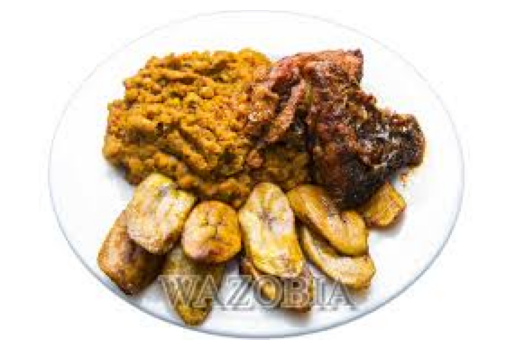

Image  8
Prediction: dodo(51%) and puff puff(1%)|  Actual: dodo and  ewa


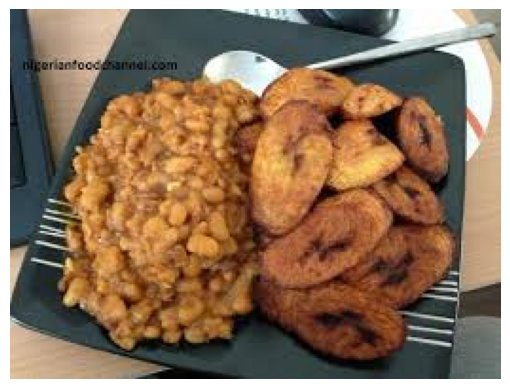

Image  9
Prediction: ewa(24%) and dodo(13%)|  Actual: dodo and  ewa


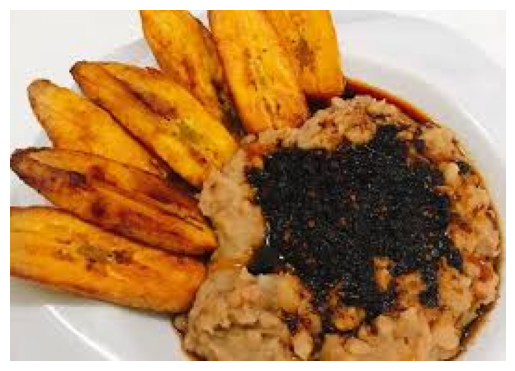

Image  10
Prediction: ewedu(7%) and moi moi(2%)|  Actual: dodo and  jollof


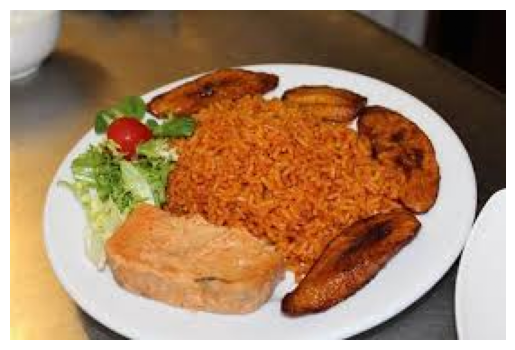

Image  11
Prediction: jollof(27%) and dodo(3%)|  Actual: dodo and  jollof


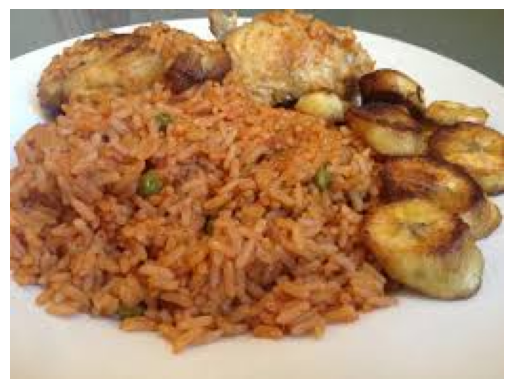

Image  12
Prediction: jollof(65%) and dodo(19%)|  Actual: dodo and  jollof


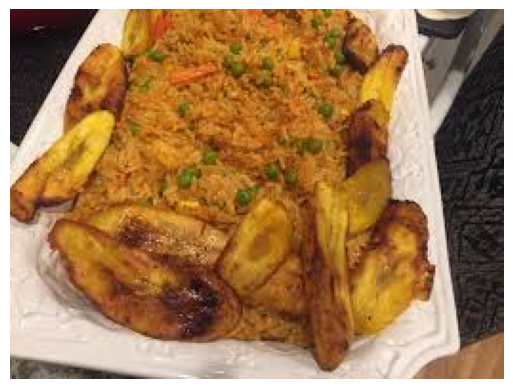

Image  13
Prediction: jollof(78%) and ewa(3%)|  Actual: dodo and  jollof


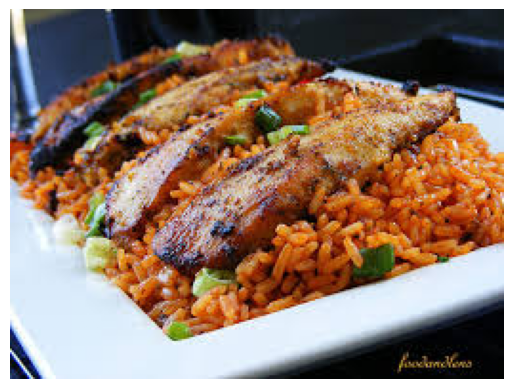

Image  14
Prediction: jollof(17%) and dodo(10%)|  Actual: dodo and  jollof


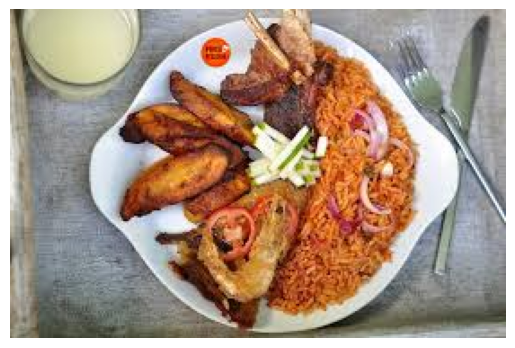

Image  15
Prediction: jollof(69%) and egusi(18%)|  Actual: dodo and  jollof


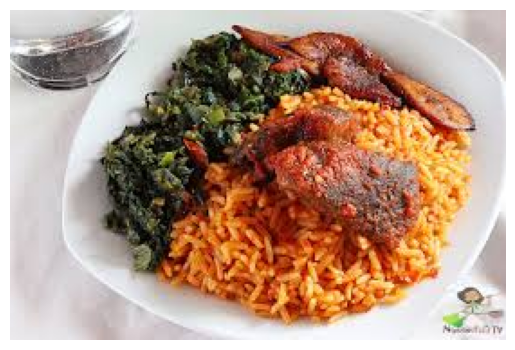

Image  16
Prediction: dodo(40%) and jollof(1%)|  Actual: dodo and  jollof


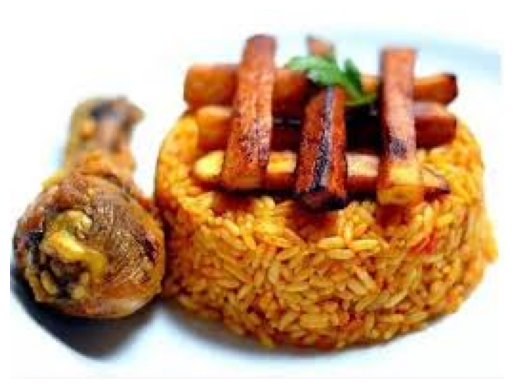

Image  17
Prediction: dodo(32%) and jollof(6%)|  Actual: dodo and  jollof


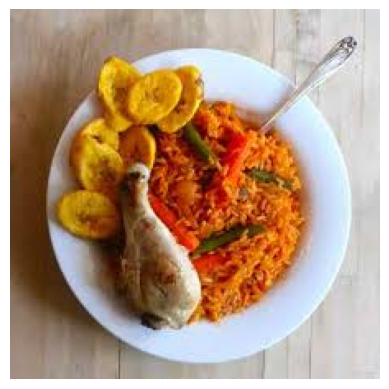

Image  18
Prediction: dodo(51%) and moi moi(46%)|  Actual: moi moi and  dodo


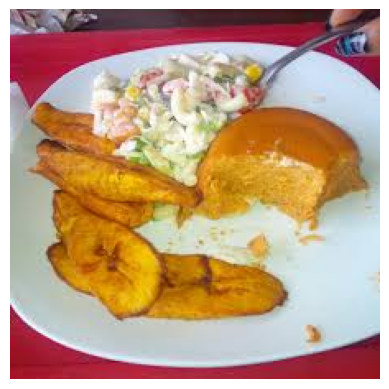

In [10]:
for i in range(len(pred)):
    print("Image ", i+1)
    special_pred = pred[i].copy()
    index_1 = int([special_pred.index(max(special_pred))][0])
    conf_1 = int(max(special_pred) * 100)
    special_pred[index_1] = 0
    conf_2 = int(max(special_pred) * 100)
    index_2 = int([special_pred.index(max(special_pred))][0])
    
    print(f'Prediction: {pre_dict[index_1]}({conf_1}%) and {pre_dict[index_2]}({conf_2}%)'
          f'|  Actual: {labels[i][0]} and {labels[i][1]}')
    plt.imshow(image[i])
    plt.axis('off')
    plt.show()